In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
len(model.parameters_rules())

105

In [3]:
os.chdir('/Users/Erin/git/accre_data_analysis/normal_priors_sd3_nothin')

In [4]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamz_5chain_normal_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 5):
        traces[trace].append(np.load('earm_dreamz_5chain_normal_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [5]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamz_5chain_normal_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 5):
        logps[trace].append(np.load('earm_dreamz_5chain_normal_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-2446.43027743]
 [-1805.14356418]
 [-1805.14356418]
 ..., 
 [  155.34659856]
 [  155.34659856]
 [  155.34659856]]
Logp of trace:  a  chain:  1  =  [ 153.54677725]
Logp of trace:  a  chain:  2  =  [ 157.13593774]
Logp of trace:  a  chain:  3  =  [ 151.15189582]
Logp of trace:  a  chain:  4  =  [ 153.98416925]
Logp of trace:  b  chain: 0 =  [[-2523.03547228]
 [-2523.03547228]
 [-2523.03547228]
 ..., 
 [  150.08544761]
 [  150.08544761]
 [  150.08544761]]
Logp of trace:  b  chain:  1  =  [ 157.01206605]
Logp of trace:  b  chain:  2  =  [ 155.61791526]
Logp of trace:  b  chain:  3  =  [ 151.61921866]
Logp of trace:  b  chain:  4  =  [ 155.9686364]
Logp of trace:  c  chain: 0 =  [[-2038.77628445]
 [-2038.77628445]
 [-2038.77628445]
 ..., 
 [  158.74823855]
 [  158.74823855]
 [  158.74823855]]
Logp of trace:  c  chain:  1  =  [ 157.7537242]
Logp of trace:  c  chain:  2  =  [ 146.42541537]
Logp of trace:  c  chain:  3  =  [ 156.93230611]
Logp of trace:  c  cha

In [6]:
traces['b'][0][:,72]

array([-1.0782933 , -1.0782933 , -1.0782933 , ...,  1.39265075,
        1.39265075,  1.39265075])

In [7]:
traces['a'][0][:,72]

array([-1.09309177, -1.42857757, -1.42857757, ..., -1.76676208,
       -1.76676208, -1.76676208])

In [8]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [9]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  74  of  105  parameters.
Percent of parameters with GR below 1.2:  70.4761904762
Number of parameters with GR below 1.1:  42  of  105  parameters.
Percent of parameters with GR below 1.1:  40.0


[74, 70.47619047619048, 42, 40.0]

In [10]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  104  of  105  parameters.
Percent of parameters with GR below 1.2:  99.0476190476
Number of parameters with GR below 1.1:  90  of  105  parameters.
Percent of parameters with GR below 1.1:  85.7142857143


[104, 99.04761904761905, 90, 85.71428571428571]

In [11]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  49  of  105  parameters.
Percent of parameters with GR below 1.2:  46.6666666667
Number of parameters with GR below 1.1:  23  of  105  parameters.
Percent of parameters with GR below 1.1:  21.9047619048


[49, 46.666666666666664, 23, 21.904761904761905]

In [12]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  98  of  105  parameters.
Percent of parameters with GR below 1.2:  93.3333333333
Number of parameters with GR below 1.1:  65  of  105  parameters.
Percent of parameters with GR below 1.1:  61.9047619048


[98, 93.33333333333333, 65, 61.904761904761905]

In [13]:
param_trace_dicts['d']['bind_L_R_to_LR_kf']

[array([-6.35314372, -6.35314372, -6.7661386 , ..., -7.10133296,
        -7.10133296, -7.10133296]),
 array([-6.18167939, -6.18167939, -6.18167939, ..., -5.30463593,
        -5.30463593, -5.30463593]),
 array([-6.27835327, -6.27835327, -6.27835327, ..., -4.7953532 ,
        -4.7953532 , -4.7953532 ]),
 array([-6.33544175, -6.33544175, -6.33544175, ..., -5.18249942,
        -5.18249942, -5.18249942]),
 array([-6.30083983, -6.30083983, -6.30083983, ..., -6.62155514,
        -6.62155514, -6.62155514])]

50000
5
50000


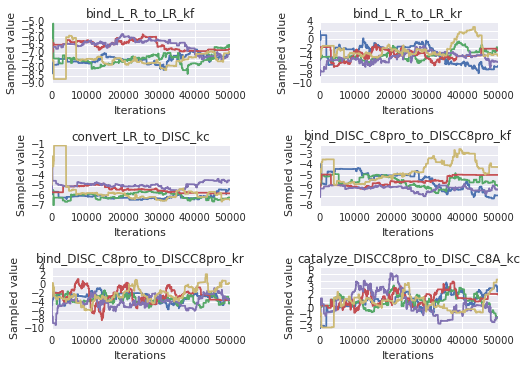

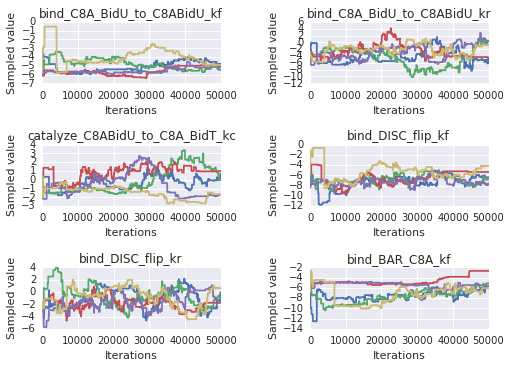

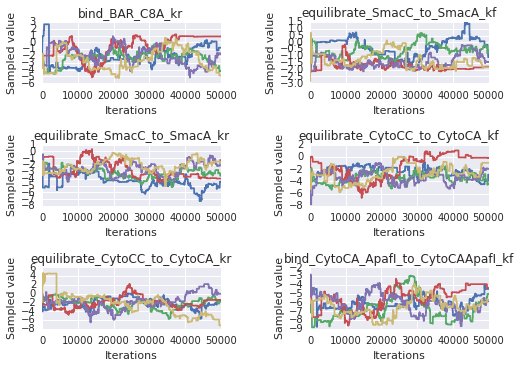

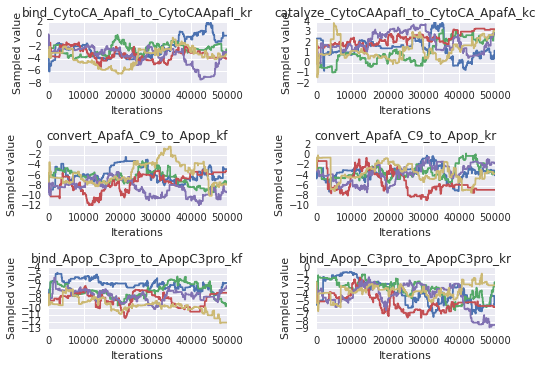

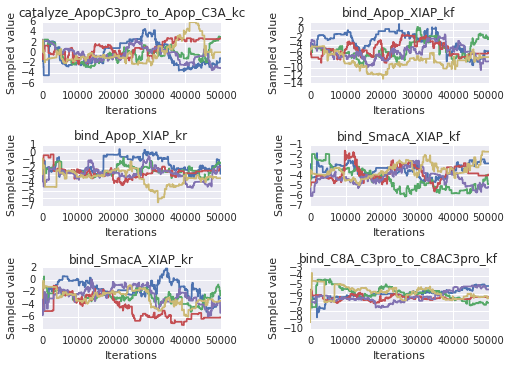

...

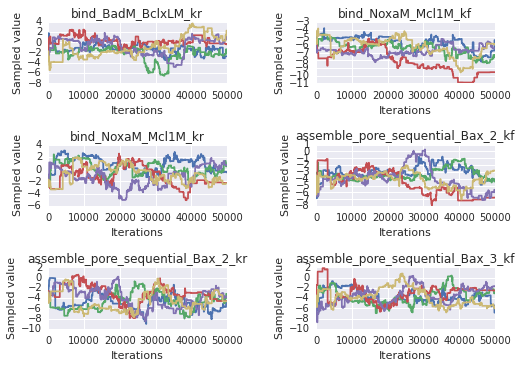

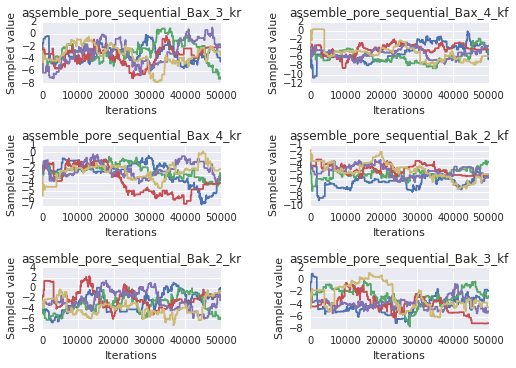

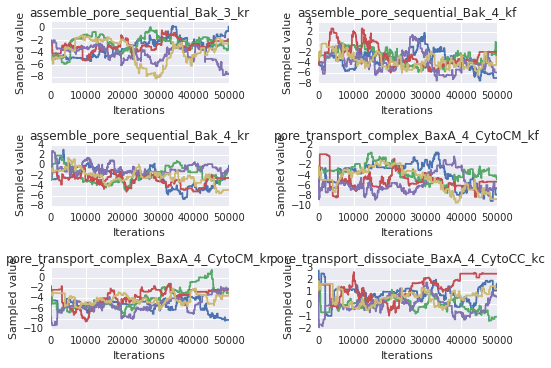

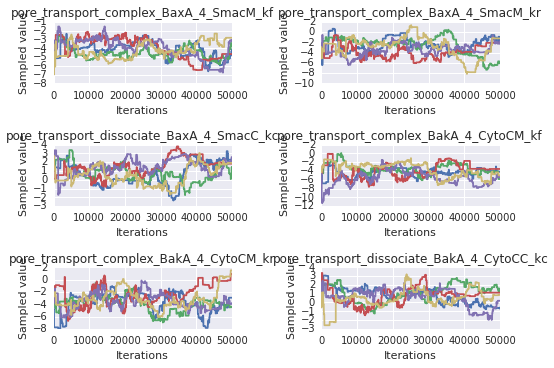

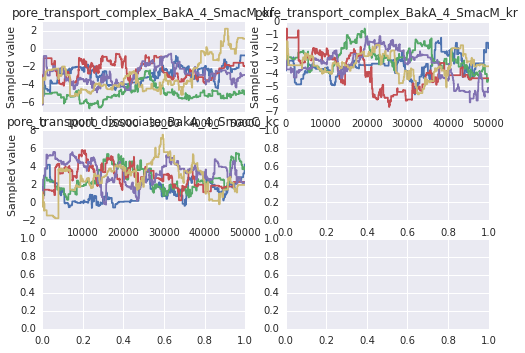

In [14]:
sample_plots(param_trace_dicts['a'])

In [15]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=30000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=30000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=30000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=30000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


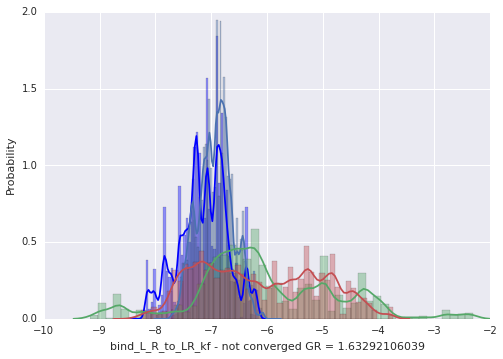

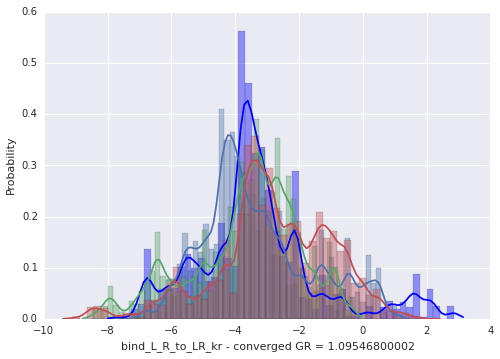

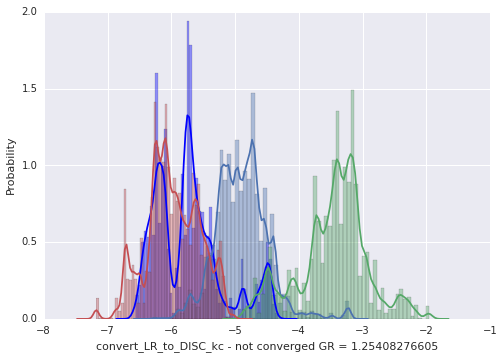

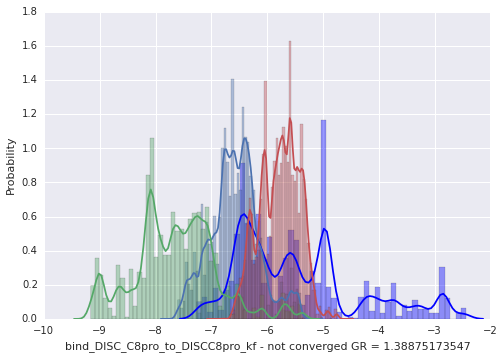

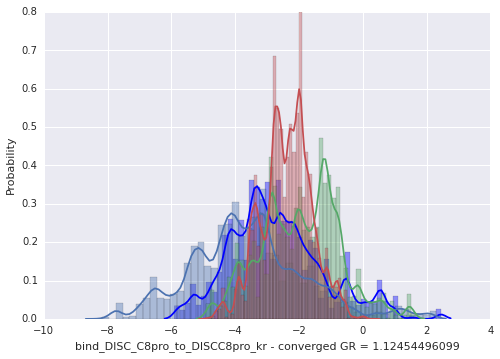

...

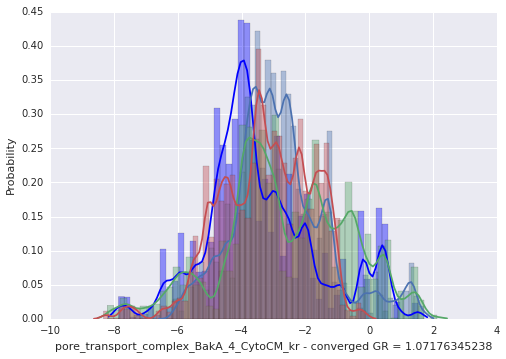

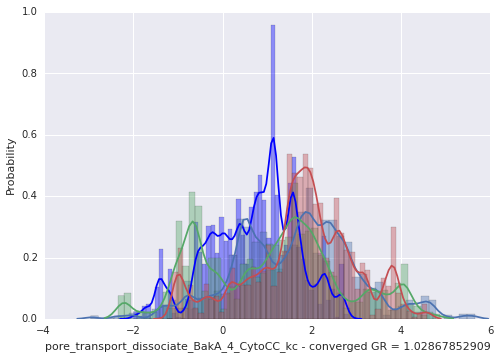

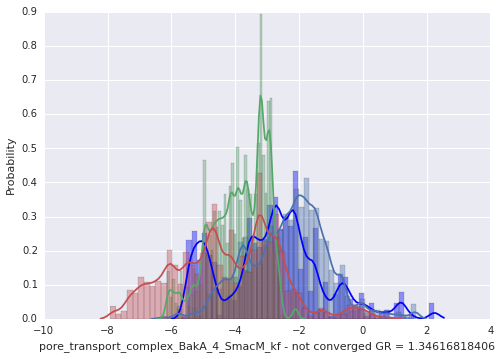

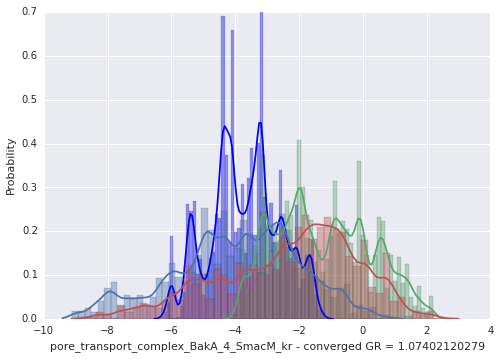

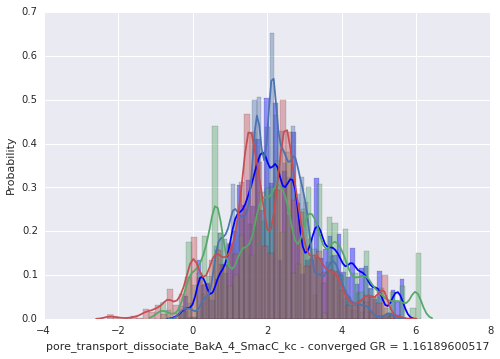

In [16]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True)
    sns.distplot(trace_arr_c[:,dim], hist=True)
    sns.distplot(trace_arr_d[:,dim], hist=True)
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

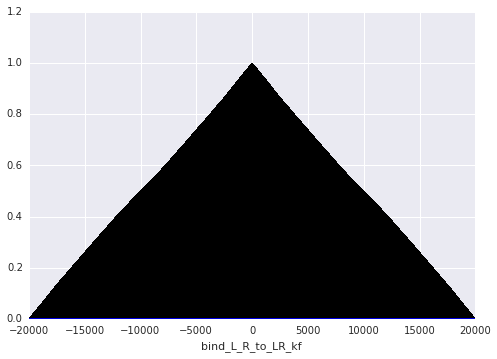

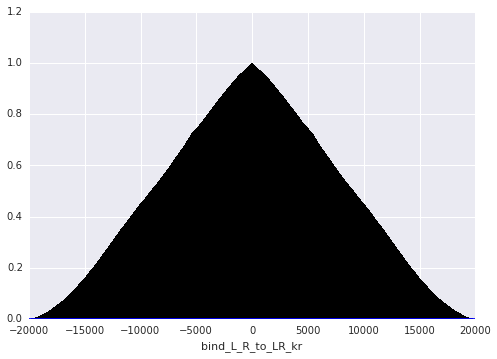

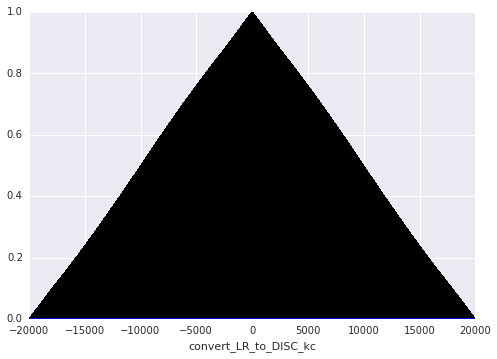

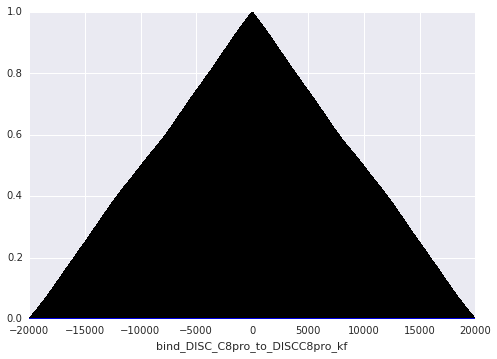

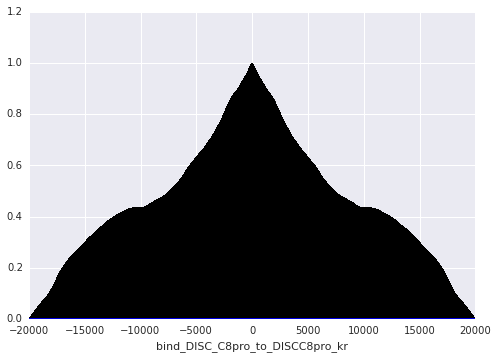

...

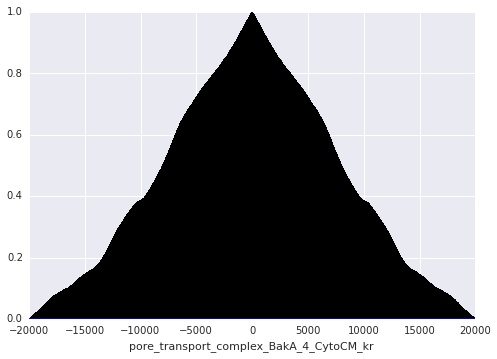

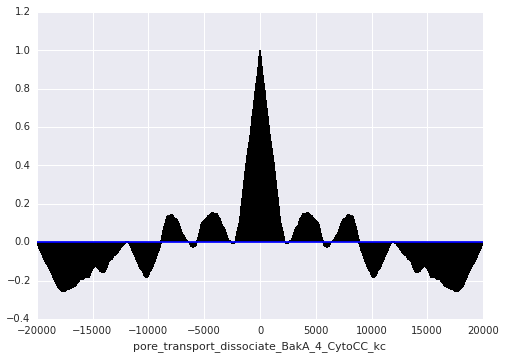

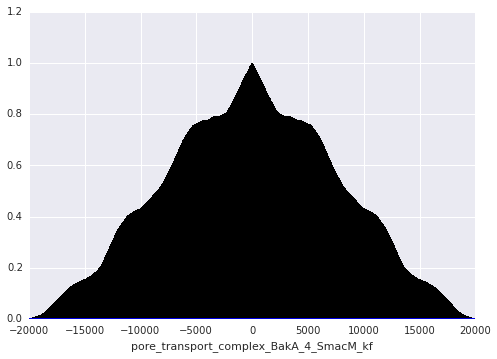

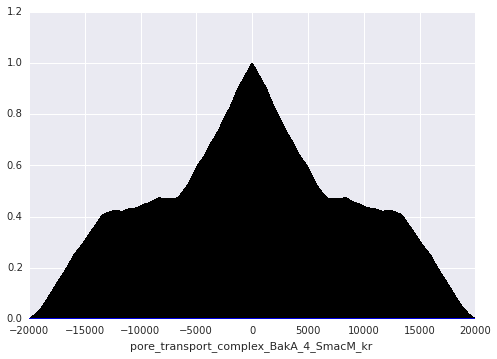

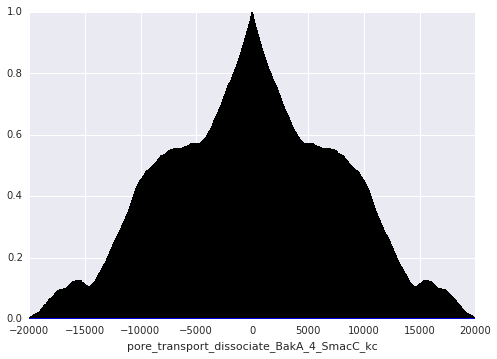

In [17]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][30000::,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)